# The Butterfly Effect - Exploratory Data Analysis and Model dataset preparation

Chloe Cousin - [LinkedIn](https://www.linkedin.com/in/chloe-m-cousin/) / [Github](https://github.com/chloecousin)

## Purpose of the analysis

=> Predict the evolution of the butterfly population in the context of climate change and see if and how external factors such as weather or air quality affect them.

The butterfly population has been widely studied across the world over the last decades. The butterflies are indeed thought to be one of the best indicators of a healthy environment. As they have short life cycles, they have quick responses to environmental changes. 

## Key findings

In this notebook, I explore the dataset I collected, with the following steps and findings:

1. __Data preparation__:
   - Check the input data, transform the column names / format...
   - Merge the first dataset (around 6M entries, 1 per butterfly sighting) with:
       - a second about butterfly traits (around 12K entries, 1 per species) and
       - a third about endangered species (about 100 entries, 1 per species).
   - This step took some time since there were some duplicates in the species names, and I wanted to make sure I was loosing as little information as possible.
2. __EDA__ (most important findings):
   - Most of the sightings are located in England
   - The sightings have seasonal pattern, with a peak each year in July
   - The sightings have a trend upward, more and more sightings have been recorded over the years, BUT this is not an indicator of how the butterfly population is faring. To get such indicator I found a way to know how many surveys had been conducted each month (unique pairs of sighting date and sighting number Ordnance Survey grid reference, aka date and location) and created a new variable: number of butterfly seen per survey (average for each month)
3. __Focus London__: I prepared the dataset for the models I will build in the 2nd and 3rd notebooks by extracting the sightings recorded in London and aggregating them by:
   - month with number of sightings,
   - number of surveys,
   - number of butterfly per survey and
   - a seasonal decompose

# Data preparation

## Imports

In [1]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import month_plot
from statsmodels.api import tsa

## Dataset 1 - Butterfly Monitoring Scheme (D1)

__COMMENT:__ The first and main dataset we are going to be using is: 

- __Content__: a collection of butterfly sightings gathered by the UKBMS (United Kingdom Butterfly Monitoring Scheme), and is '_one of the longest running insect monitoring schemes in the world_'
- __1 row equals__: 1 butterfly sighting (for example: one monarch, at this location, on that day)
- __Period__: 2001 - 2020
- __From__: https://nbnatlas.org/ (National Biodiversity Network Trust)

The initial CSV files amounted for about 3Go, we therefore uploaded them once, the commands used were:

In [2]:
# csv_files = glob.glob('data/NBN_UKBMS_*.csv')
# df_NBN_UKBMS = pd.DataFrame()

# for csv_file in csv_files:
#     df=pd.read_csv(csv_file)
#     df_NBN_UKBMS = pd.concat([df_NBN_UKBMS, df])

__COMMENT:__  The initial shape was 6392186 rows and 56 columns. The columns removed were the ones with:

- no data or
- similar data thoughout the dataset or
- information we are not going to be using in this project

(Each column were checked with 'df_NBN_UKBMS['   '].value_counts().sort_values()' before being removed. For the purpose of keeping the notebook readable, we did not add all the outputs).

Note: All `basis of record` were Human observation

In [3]:
# df_NBN_UKBMS = df_NBN_UKBMS.drop(columns=['NBN Atlas record ID', 'Licence', 'Rightsholder', 'Taxon author', 'Name qualifier', 'Species ID (TVK)', 
#                            'Taxon Rank', 'Occurrence status', 'End date', 'End date day', 'End date month', 'End date year', 'Locality', 
#                            'Coordinate uncertainty (m)', 'Verbatim depth', 'Recorder', 'Determiner', 'Individual count', 'Abundance', 
#                            'Abundance scale', 'Organism scope', 'Organism remarks', 'Sex', 'Life stage', 'Occurrence remarks',
#                            'Identification verification status', 'Basis of record', 'Survey key', 'Dataset name', 'Dataset ID', 
#                            'Data provider', 'Data provider ID', 'Institution code', 'Kingdom', 'Phylum', 'Class', 'Order', 'Country',
#                            'Vitality'])

In [4]:
# df_NBN_UKBMS.to_csv('data/df_NBN_UKBMS_clean.csv')

In [5]:
# Now importing the concatenated and cleaned file
df_NBN_UKBMS2 = pd.read_csv('data/1.df_NBN_UKBMS_clean.csv')

In [6]:
df_NBN_UKBMS2.head(3)

,Unnamed: 0,Occurrence ID,Scientific name,Common name,Start date,Start date day,Start date month,Start date year,OSGR,Latitude (WGS84),Longitude (WGS84),Family,Genus,OSGR 100km,OSGR 10km,OSGR 2km,OSGR 1km,State/Province
0,0,5616398,Gonepteryx rhamni,Brimstone,2009-03-16,16,3,2009,TL2550,52.138550,-0.167627,Pieridae,Gonepteryx,TL,TL25,TL25K,TL2550,England
1,1,7628186,Gonepteryx rhamni,Brimstone,2009-03-18,18,3,2009,SU8533,51.094445,-0.780437,Pieridae,Gonepteryx,SU,SU83,SU83L,SU8533,England
2,2,5815274,Polygonia c-album,Comma,2009-03-22,22,3,2009,TQ1684,51.547376,-0.321280,Nymphalidae,Polygonia,TQ,TQ18,TQ18S,TQ1684,England


In [7]:
df_NBN_UKBMS2.shape

(6392186, 18)

In [8]:
df_NBN_UKBMS2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6392186 entries, 0 to 6392185
Data columns (total 18 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Unnamed: 0         int64  
 1   Occurrence ID      int64  
 2   Scientific name    object 
 3   Common name        object 
 4   Start date         object 
 5   Start date day     int64  
 6   Start date month   int64  
 7   Start date year    int64  
 8   OSGR               object 
 9   Latitude (WGS84)   float64
 10  Longitude (WGS84)  float64
 11  Family             object 
 12  Genus              object 
 13  OSGR 100km         object 
 14  OSGR 10km          object 
 15  OSGR 2km           object 
 16  OSGR 1km           object 
 17  State/Province     object 
dtypes: float64(2), int64(5), object(11)
memory usage: 877.8+ MB


__COMMENT:__ We have 16 columns that can be worked with, the data dictionnary for those is: 

- `Occurrence ID`: An identifier for the Occurrence
- `Scientific name`: The full scientific name, with authorship and date information if known
- `Common name`: A common or vernacular name
- `Start date`: The date-time during which a Event occurred. For occurrences, this is the date-time when the Event was recorded
- `Start date day`: The day the event occurred in
- `Start date month`: The ordinal month the event occurred in
- `Start date year`: The year the event occurred in
- `OSGR`: Ordnance Survey grid reference as supplied with the raw record
- `Latitude (WGS84)`: Processed decimal latitude in WGS84 datum. Calculated from grid reference if not supplied
- `Longitude (WGS84)`: Processed decimal longitude in WGS84 datum. Calculated from grid reference if not supplied
- `Family`: The full scientific name of the family in which the Taxon is classified
- `Genus`: The full scientific name of the genus in which the Taxon is classified
- `OSGR 100km `: The processed 100km OS grid reference
- `OSGR 10km `: The processed 10km OS grid reference
- `OSGR 2km `: The processed 2km OS grid reference
- `OSGR 1km `: The processed 1km OS grid reference
- `State/Province`: UK country

Some columns need to be dealt with before exploring the dataset:

In [9]:
# The date column needs to be changed to datetime format
df_NBN_UKBMS2['Start date'] = pd.to_datetime(df_NBN_UKBMS2['Start date'])

In [10]:
# For ease for manipulation, we will remove all spaces in columns name by '_'
df_NBN_UKBMS2.rename(columns=lambda x: x.replace(' ', '_'), inplace=True)

# Removing parenthesis as well
df_NBN_UKBMS2.rename(columns=lambda x: x.replace('(', ''), inplace=True)
df_NBN_UKBMS2.rename(columns=lambda x: x.replace(')', ''), inplace=True)

# Removing first column 'Unnamed: 0', created after the export to CSV (No original info)
df_NBN_UKBMS2 = df_NBN_UKBMS2.drop(columns=['Unnamed:_0'])

In [11]:
# Checking current state of the dataset
df_NBN_UKBMS2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6392186 entries, 0 to 6392185
Data columns (total 17 columns):
 #   Column            Dtype         
---  ------            -----         
 0   Occurrence_ID     int64         
 1   Scientific_name   object        
 2   Common_name       object        
 3   Start_date        datetime64[ns]
 4   Start_date_day    int64         
 5   Start_date_month  int64         
 6   Start_date_year   int64         
 7   OSGR              object        
 8   Latitude_WGS84    float64       
 9   Longitude_WGS84   float64       
 10  Family            object        
 11  Genus             object        
 12  OSGR_100km        object        
 13  OSGR_10km         object        
 14  OSGR_2km          object        
 15  OSGR_1km          object        
 16  State/Province    object        
dtypes: datetime64[ns](1), float64(2), int64(4), object(10)
memory usage: 829.1+ MB


In [12]:
df_NBN_UKBMS2.describe()

,Occurrence_ID,Start_date,Start_date_day,Start_date_month,Start_date_year,Latitude_WGS84,Longitude_WGS84
count,6.392186e+06,6392186,6.392186e+06,6.392186e+06,6.392186e+06,6.392186e+06,6.392186e+06
mean,4.158832e+06,2012-11-30 18:21:16.924295424,1.569877e+01,6.871717e+00,2.012389e+03,5.194424e+01,-1.493719e+00
min,1.000000e+00,2001-03-25 00:00:00,1.000000e+00,3.000000e+00,2.001000e+03,4.996926e+01,-7.824283e+00
25%,1.777959e+06,2008-07-23 00:00:00,8.000000e+00,6.000000e+00,2.008000e+03,5.105378e+01,-2.363935e+00
50%,4.670916e+06,2013-09-04 00:00:00,1.600000e+01,7.000000e+00,2.013000e+03,5.149551e+01,-1.451009e+00
75%,6.475400e+06,2017-08-22 00:00:00,2.300000e+01,8.000000e+00,2.017000e+03,5.235949e+01,-3.978160e-01
max,8.169589e+06,2020-10-27 00:00:00,3.100000e+01,1.000000e+01,2.020000e+03,5.860651e+01,1.693422e+00
std,2.549498e+06,NaN,8.821502e+00,1.312393e+00,5.570376e+00,1.325041e+00,1.432626e+00


__COMMENT:__ Nothing really informative here, except the Start_date_month witch spans from March to October (3 to 10), with a peak of sightings around July (mean = 6.8 and median=7).

In [13]:
# Checking that we do not have any duplicates
df_NBN_UKBMS2.duplicated().sum()

0

In [14]:
# Cehcking if we have missing values
df_NBN_UKBMS2.isna().sum()

Occurrence_ID         0
Scientific_name       0
Common_name           0
Start_date            0
Start_date_day        0
Start_date_month      0
Start_date_year       0
OSGR                  0
Latitude_WGS84        0
Longitude_WGS84       0
Family                0
Genus                 0
OSGR_100km            0
OSGR_10km             0
OSGR_2km            234
OSGR_1km            234
State/Province        0
dtype: int64

__COMMENT:__ we do have missing values for `OSGR_2km` and `OSGR_1km`. At this point, it is not entirely sure that we will be using these fields as we have other location information in other columns (OSGR / Latitude / Longitude), so we will leave them as is for now.

## Dataset 2 - LepTraits (D2)

__COMMENT:__ The second dataset we are going to be using is: 

- __Content__: a globally comprehensive dataset of butterfly traits (Lepidoptera or lepidopterans is an order of winged insects that includes butterflies and moths)
- __1 row equals__: 1 butterfly species traits (for example: this butterfly has this wingspan, flights from this month to this month)
- __Period__: N/A
- __From__: https://www.nature.com/articles/s41597-022-01473-5 and https://github.com/RiesLabGU/LepTraits/

The columns we are going to use in this analysis are:

- `Species`: The scientific name of the species account
- `verbatimSpecies`: The given (from the original resource) name of the species account
- `WS_L_Fem`: The lowest measurement reported for female wingspan in centimeters
- `WS_U_Fem`: The highest (or sole) measurement reported for female wingspan in centimeters
- `WS_L_Mal`: The lowest measurement reported for male wingspan in centimeters
- `WS_U_Mal`: The highest (or sole) measurement reported for male wingspan in centimeters
- `Jan` to `Dec`: Whether or not adult flight can occur in a given month
- `FlightDuration`: Total potential duration of adult flight in number of months
- `Voltinism`: How many generations the species can have in a given year: (U)nivoltine, (B)ivoltine, (M)ultivoltine
- `CanopyAffinity`: The affinity of the species towards a specific type of canopy cover
- `EdgeAffinity`: The affinity of the species towards habitat edges
- `MoistureAffinity`: The affinity of the species towards a specific level of moisture
- `DisturbanceAffinity`: The affinity of the species towards a specific level of disturbance
- `NumberOfHostplantFamilies`: The number of reported hostplant families for the species

The other columns will be dropped after the merge with D1.

In [15]:
df_LepTraits = pd.read_csv('data/2.LepTraits_consensus.csv')
df_LepTraits.head()

,Family,Genus,Species,verbatimSpecies,WS_L_Fem,WS_U_Fem,WS_L_Mal,WS_U_Mal,WS_L,WS_U,...,EdgeAffinity,MoistureAffinity,DisturbanceAffinity,NumberOfHostplantFamilies,SoleHostplantFamily,PrimaryHostplantFamily,SecondaryHostplantFamily,EqualHostplantFamily,NumberOfHostplantAccounts,DateCreated
0,Hesperiidae,Abantis,Abantis arctomarginata,Abantis arctomarginata,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,Phyllanthaceae,NaN,NaN,NaN,1.0,3/9/2022 15:23
1,Hesperiidae,Abantis,Abantis bamptoni,Abantis bamptoni,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,Phyllanthaceae,NaN,NaN,NaN,1.0,3/9/2022 15:23
2,Hesperiidae,Abantis,Abantis bergeri,Abantis bergeri,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3/9/2022 15:23
3,Hesperiidae,Abantis,Abantis bicolor,Abantis bicolor,NaN,NaN,NaN,NaN,NaN,NaN,...,Edge-associated (strong),No evidence for moisture association,NaN,1.0,Malvaceae,NaN,NaN,NaN,1.0,3/9/2022 15:23
4,Hesperiidae,Abantis,Abantis bismarcki,Abantis bismarcki,NaN,NaN,NaN,NaN,NaN,2.0,...,Edge association varies,Xeric-associated (strong),NaN,1.0,Phyllanthaceae,NaN,NaN,NaN,1.0,3/9/2022 15:23


In [16]:
df_LepTraits.shape

(12448, 43)

In [17]:
df_LepTraits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12448 entries, 0 to 12447
Data columns (total 43 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Family                     12448 non-null  object 
 1   Genus                      12448 non-null  object 
 2   Species                    12448 non-null  object 
 3   verbatimSpecies            12448 non-null  object 
 4   WS_L_Fem                   1041 non-null   float64
 5   WS_U_Fem                   2198 non-null   float64
 6   WS_L_Mal                   1133 non-null   float64
 7   WS_U_Mal                   2497 non-null   float64
 8   WS_L                       3594 non-null   float64
 9   WS_U                       6813 non-null   float64
 10  FW_L_Fem                   0 non-null      float64
 11  FW_U_Fem                   0 non-null      float64
 12  FW_L_Mal                   0 non-null      float64
 13  FW_U_Mal                   0 non-null      flo

In [18]:
# Cell used for checking values in various columns
df_LepTraits['DateCreated'].value_counts()

DateCreated
3/9/2022 15:23    12448
Name: count, dtype: int64

In [19]:
# Deleting columns that won't be used in this project
df_LepTraits2 = df_LepTraits.drop(columns=['Family', 'Genus', 'FW_U_Fem', 'FW_L_Fem', 'FW_L_Mal', 
                                           'FW_U_Mal', 'NumberOfHostplantAccounts','DateCreated'])
df_LepTraits2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12448 entries, 0 to 12447
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Species                    12448 non-null  object 
 1   verbatimSpecies            12448 non-null  object 
 2   WS_L_Fem                   1041 non-null   float64
 3   WS_U_Fem                   2198 non-null   float64
 4   WS_L_Mal                   1133 non-null   float64
 5   WS_U_Mal                   2497 non-null   float64
 6   WS_L                       3594 non-null   float64
 7   WS_U                       6813 non-null   float64
 8   FW_L                       355 non-null    float64
 9   FW_U                       893 non-null    float64
 10  Jan                        6518 non-null   float64
 11  Feb                        6518 non-null   float64
 12  Mar                        6518 non-null   float64
 13  Apr                        6518 non-null   flo

In [20]:
df_LepTraits2.shape

(12448, 35)

__COMMENT:__ The LepTraits dataset will be useful to get further insights on the Butterflies species seen in the UKBMS sightings. To merge the two datasets, the Species information will be our key, but we have 2 columns that contain information about the Species name:

- `Species`: the data dictionnary tells us that this is the 'Scientific name of the species account'
- `verbatimSpecies`: the data dictionnary tells us that this is the 'given (from the original resource) name of the species account'

We want to check if they share the same information. If they do not, we will explore which column we should keep as this will be used as the key for merging the datasets.

In [21]:
df_LepTraits2.groupby('Species')['verbatimSpecies'].nunique().sort_values().value_counts()

verbatimSpecies
1    11902
2      264
3        6
Name: count, dtype: int64

__COMMENT:__ we have up to 3 values for 1 in the Species column, therefore we can't conclude that the two columns share the same information. We will explore further in the 'Merge Preparation' section which values we want to keep.

## Dataset 3 - Butterflies Red List (D3)

__COMMENT:__ The third dataset we are going to be using is: 

- __Content__: List of butterflies from least vulnerable to regionally extinct species in the UK
- __1 row equals__: 1 butterfly species (for example: this species and its vulnerability status)
- __Period__: As of 2024
- __From__: https://butterfly-conservation.org/red-list-of-butterflies-in-great-britain

In [22]:
df_redlist = pd.read_csv('data/3.Butterflies_RedList.csv')
df_redlist.head()

,Species,Species_ScientificName,Red List category,Qualifying criteria,Previous (2010)\nRed List category
0,Swallowtail,Papilio machaon,Vulnerable,32% decrease in abundance 2010-2019 (IUCN crit...,Near Threatened
1,Dingy Skipper,Erynnis tages,Least Concern,Recent trend estimates for both abundance and ...,Vulnerable
2,Grizzled Skipper,Pyrgus malvae,Vulnerable,36% decrease in abundance 2010-2019 (IUCN crit...,Vulnerable
3,Chequered Skipper,Carterocephalus palaemon,Least Concern,No longer meets IUCN thresholds. Recent survey...,Endangered
4,Essex Skipper,Thymelicus lineola,Least Concern,NaN,Least Concern


In [23]:
df_redlist.shape

(62, 5)

In [24]:
df_redlist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 5 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   Species                            62 non-null     object
 1   Species_ScientificName             62 non-null     object
 2   Red List category                  62 non-null     object
 3   Qualifying criteria                38 non-null     object
 4   Previous (2010)
Red List category  62 non-null     object
dtypes: object(5)
memory usage: 2.6+ KB


In [25]:
# For ease for manipulation, we will remove all spaces in columns name by '_'
df_redlist.rename(columns=lambda x: x.replace(' ', '_'), inplace=True)

# Removing parenthesis as well
df_redlist.rename(columns=lambda x: x.replace('(', ''), inplace=True)
df_redlist.rename(columns=lambda x: x.replace(')', ''), inplace=True)

# Dropping the columns that we won't be using in this project
df_redlist = df_redlist.drop(columns=['Species', 'Qualifying_criteria'])

In [26]:
# Removing the \n from the last column
df_redlist = df_redlist.rename(columns={'Previous_2010\nRed_List_category':'2010_Red_List_category'})

## Merges

### D1: Key = Scientific_name of species (UKBMS dataset)

In [27]:
UKBMS_species = df_NBN_UKBMS2['Scientific_name'].unique()
UKBMS_species

array(['Gonepteryx rhamni', 'Polygonia c-album', 'Pieris brassicae',
       'Maniola jurtina', 'Aglais urticae', 'Aglais io',
       'Pararge aegeria', 'Pieris napi', 'Vanessa atalanta',
       'Aphantopus hyperantus', 'Lycaena phlaeas', 'Pyronia tithonus',
       'Argynnis paphia', 'Pieris rapae', 'Vanessa cardui',
       'Lasiommata megera', 'Coenonympha pamphilus', 'Colias croceus',
       'Aricia agestis', 'Celastrina argiolus', 'Polyommatus icarus',
       'Pyrgus malvae', 'Anthocharis cardamines', 'Callophrys rubi',
       'Erynnis tages', 'Hamearis lucina', 'Leptidea sinapis',
       'Euclidia glyphica', 'Cupido minimus', 'Boloria selene',
       'Boloria euphrosyne', 'Tyria jacobaeae', 'Ochlodes sylvanus',
       'Polyommatus bellargus', 'Melitaea cinxia',
       'Carterocephalus palaemon', 'Hipparchia semele',
       'Euphydryas aurinia', 'Polyommatus coridon', 'Melanargia galathea',
       'Speyeria aglaja', 'Thymelicus sylvestris', 'Aricia artaxerxes',
       'Fabriciana adi

In [28]:
len(UKBMS_species)

71

__COMMENT:__ we find 71 different species in the UKBMS dataset. Those are the species we want to find in the other datasets as they will be our key for the merges.

### D2: Merge (LepTraits Dataset)

__Step 0: Comments__

__COMMENT:__ This part is very important before proceeding with further analysis. Indeed, we know that we do not have the same information in the `Species` column and in the `verbatimSpecies` column. The data dictionnary (mentionned in the Dataset 2 section above) does not provide further indication as to which column would be better suited for our analysis. As the species name will be our key to merge the UKBMS dataset (D1) and the LepTraits dataset (D2), we need to make sure we keep as much information as possible. Our two main potential issues here are:

- __Missing species in LepTraits__: if we delete one column with species name needed for the merge (aka present in the UKBMS dataset - D1) that cannot be found in the column we keep, this would result in information uselessly lost
- __Duplicates values in LepTraits__: if we have for example two rows with the same species name, the merge would result in duplicating the rows in the initial dataset and result in a wrong number of sightings. If we do have duplicates in the LepTraits dataset (D2), we also need to confirm if the rows share the same information about the butterfly species traits, or, if not, decide which one to keep.

To avoid any issues in the merge, our process will thus be:

1- __Check the number of unique values in each column__: 

- 1a - If they are the same as the number of rows => we do not have duplicates
- 1b - If there are fewer unique values compared to the number of rows in D2 => we have duplicates that need to be dealt with

2- __Check matching species with D1__:

- 2a - If both columns have the same missing species: it does not matter which column we keep in this regard 
- 2b - If the 2 columns do not have the same missing species: we will need to keep the column with the most info

3- __Deal with duplicates and drop one column__:

See if there is a column where the duplicates are easier to deal with than the other

4- __Count the number of sightings in D1 where we do not have LepTraits info__ 

__Step 1: Unique values in each column__

In [29]:
# Unique Species in the verbatimSpecies column
listverbatim_Lep = np.array(df_LepTraits2['verbatimSpecies'].unique())
print(f'There are {len(listverbatim_Lep)} unique species in the verbatimSpecies column.')

# Unique Species in the Species column
listspecies_Lep = np.array(df_LepTraits2['Species'].unique())
print(f'There are {len(listspecies_Lep)} unique species in the Species column.')

There are 12165 unique species in the verbatimSpecies column.
There are 12172 unique species in the Species column.


__COMMENT:__ We have duplicates in both columns (less species than the number of rows in the dataset, aka 12,448), we will need to make sure we keep the rows with the most information.

__Step 2: Matchings species with D1__

In [30]:
# Check how many matches we have with the verbatimSpecies column
list_match_verbatim = df_NBN_UKBMS2[df_NBN_UKBMS2['Scientific_name'].isin(listverbatim_Lep)]['Scientific_name'].unique()
len(list_match_verbatim)

60

In [31]:
# Check how many matches we have with the Species column
list_match_species = df_NBN_UKBMS2[df_NBN_UKBMS2['Scientific_name'].isin(listspecies_Lep)]['Scientific_name'].unique()
len(list_match_species)

60

In [32]:
# Checking if all 'verbatimSpecies' (D2) matching a species in D1 are the same as the matching species in 'Species' (D2)
list_match_verbatim == list_match_species

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

__COMMENT:__ It looks like all the species matched with D1 (UKBMS dataset) from either the `verbatimSpecies` column or the `Species` column are the same, so it won't matter which column we decide to delete in this regard. 

__Step 3: Delete column with redundant info (D2)__

__COMMENT:__ As we know we have some duplicates, we want to keep only the matching species before deciding on how to deal with duplicates (maybe it won't matter, maybe there will be more with one column or the other).

In [33]:
# verbatimSpecies column

# 1 - Removing species not matched with UKBMS
df_LepTraits_verb = df_LepTraits2.copy()
df_LepTraits_verb = df_LepTraits_verb[df_LepTraits_verb['verbatimSpecies'].isin(list_match_verbatim)]
print(f"Matching species between D1 and D2['verbatimSpecies'] (with potential duplicates): {df_LepTraits_verb.shape[0]}")

# 2 - Counting duplicated values
print(f"Number of duplicates in LepTraits (matching species in UKBMS): {df_LepTraits_verb['verbatimSpecies'].duplicated().sum()}")
print('\n')

# 3 - Getting the list of duplicated verbatimSpecies and first look at the rows with duplicated verbatimSpecies
verbatim_Duplicates = list(df_LepTraits2[df_LepTraits2['verbatimSpecies'].duplicated()]['verbatimSpecies'])
LepTraits_duplicated_verbatim = df_LepTraits2[df_LepTraits2['verbatimSpecies'].isin(verbatim_Duplicates)]
LepTraits_duplicated_verbatim.head(6)

Matching species between D1 and D2['verbatimSpecies'] (with potential duplicates): 80
Number of duplicates in LepTraits (matching species in UKBMS): 20




,Species,verbatimSpecies,WS_L_Fem,WS_U_Fem,WS_L_Mal,WS_U_Mal,WS_L,WS_U,FW_L,FW_U,...,OvipositionStyle,CanopyAffinity,EdgeAffinity,MoistureAffinity,DisturbanceAffinity,NumberOfHostplantFamilies,SoleHostplantFamily,PrimaryHostplantFamily,SecondaryHostplantFamily,EqualHostplantFamily
7,Abantis elegantula,Abantis venosa,NaN,4.1,3.8,3.9,2.689,3.662,1.778,2.286,...,NaN,Mixed canopy (open affinity),Edge-avoidant (strong),Xeric-associated (weak),NaN,2.0,NaN,Malvaceae,Fabaceae,NaN
19,Abantis venosa,Abantis venosa,NaN,4.1,3.8,3.9,2.689,3.662,1.778,2.286,...,NaN,Mixed canopy (open affinity),Edge-avoidant (strong),Xeric-associated (weak),NaN,2.0,NaN,Malvaceae,Fabaceae,NaN
22,Abraximorpha davidii,Abraximorpha davidii,NaN,NaN,NaN,NaN,3.900,4.500,NaN,NaN,...,S,Mixed canopy (open affinity),Edge-associated (strong),No evidence for moisture association,Disturbance-associated (strong),2.0,NaN,Rosaceae,Lauraceae,NaN
24,Abraximorpha esta,Abraximorpha davidii,NaN,NaN,NaN,NaN,3.900,4.500,NaN,NaN,...,S,Mixed canopy (open affinity),Edge-associated (strong),No evidence for moisture association,Disturbance-associated (strong),2.0,NaN,Rosaceae,Lauraceae,NaN
190,Apallaga confusa,Apallaga confusa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
226,Apallaga occidentalis,Apallaga confusa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
# Species column

# 1 - Removing species not matched with UKBMS
df_LepTraits_spec = df_LepTraits2.copy()
df_LepTraits_spec = df_LepTraits_spec[df_LepTraits_spec['Species'].isin(list_match_species)]
print(f"Matching species between D1 and D2['Species'] (with potential duplicates): {df_LepTraits_spec.shape[0]}")

# 2 - Counting duplicated values
print(f"Number of duplicates in LepTraits (matching species in UKBMS): {df_LepTraits_spec['Species'].duplicated().sum()}")
print('\n')

# 3 - Getting the list of duplicated verbatimSpecies and first look at the rows with duplicated verbatimSpecies
species_Duplicates = list(df_LepTraits2[df_LepTraits2['Species'].duplicated()]['Species'])
LepTraits_duplicated_species = df_LepTraits2[df_LepTraits2['Species'].isin(species_Duplicates)]
LepTraits_duplicated_species.head(6)

Matching species between D1 and D2['Species'] (with potential duplicates): 64
Number of duplicates in LepTraits (matching species in UKBMS): 4




,Species,verbatimSpecies,WS_L_Fem,WS_U_Fem,WS_L_Mal,WS_U_Mal,WS_L,WS_U,FW_L,FW_U,...,OvipositionStyle,CanopyAffinity,EdgeAffinity,MoistureAffinity,DisturbanceAffinity,NumberOfHostplantFamilies,SoleHostplantFamily,PrimaryHostplantFamily,SecondaryHostplantFamily,EqualHostplantFamily
6,Abantis elegantula,Abantis elegantula,NaN,4.1,3.8,3.9,2.689,3.2465,1.778,2.286,...,NaN,Canopy generalist,Edge-avoidant (strong),Xeric-associated (strong),NaN,1.0,Fabaceae,NaN,NaN,NaN
7,Abantis elegantula,Abantis venosa,NaN,4.1,3.8,3.9,2.689,3.6620,1.778,2.286,...,NaN,Mixed canopy (open affinity),Edge-avoidant (strong),Xeric-associated (weak),NaN,2.0,NaN,Malvaceae,Fabaceae,NaN
23,Abraximorpha esta,Abraximorpha esta,NaN,NaN,NaN,NaN,3.900,4.5000,NaN,NaN,...,S,NaN,NaN,NaN,NaN,2.0,NaN,Rosaceae,Celastraceae,Yes
24,Abraximorpha esta,Abraximorpha davidii,NaN,NaN,NaN,NaN,3.900,4.5000,NaN,NaN,...,S,Mixed canopy (open affinity),Edge-associated (strong),No evidence for moisture association,Disturbance-associated (strong),2.0,NaN,Rosaceae,Lauraceae,NaN
225,Apallaga occidentalis,Apallaga occidentalis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
226,Apallaga occidentalis,Apallaga confusa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


__COMMENT__: It looks like the `verbatimSpecies`duplicates will be easier to deal with: 

- `verbatimSpecies`: all values seem to be matching in duplicated rows, except the `Species` column. Once removed, we will be able to drop the duplicated rows without losing information.
- `Species`: a lot of different information in the rows with duplicated species name, this will be harder to deal with and we have another easier solution!

So we decide to go with the df_LepTraits_verb and drop the `Species`column:

In [35]:
df_LepTraits_verb = df_LepTraits_verb.drop(columns=['Species'])
df_LepTraits_verb.shape

(80, 34)

In [36]:
df_LepTraits_verb = df_LepTraits_verb.drop_duplicates()
df_LepTraits_verb.shape

(60, 34)

In [37]:
df_LepTraits_verb.head()

,verbatimSpecies,WS_L_Fem,WS_U_Fem,WS_L_Mal,WS_U_Mal,WS_L,WS_U,FW_L,FW_U,Jan,...,OvipositionStyle,CanopyAffinity,EdgeAffinity,MoistureAffinity,DisturbanceAffinity,NumberOfHostplantFamilies,SoleHostplantFamily,PrimaryHostplantFamily,SecondaryHostplantFamily,EqualHostplantFamily
494,Carterocephalus palaemon,2.4,3.0,2.3,2.9,2.188889,3.066667,NaN,NaN,0.0,...,S,Canopy generalist,Edge-associated (strong),Mesic-associated (strong),Disturbance association varies,1.0,Poaceae,NaN,NaN,NaN
975,Erynnis tages,2.8,3.2,2.8,3.2,1.300000,1.600000,NaN,NaN,0.0,...,S,Mixed canopy (open affinity),Edge-associated (strong),Xeric-associated (strong),Disturbance-associated (weak),2.0,NaN,Fabaceae,Apiaceae,NaN
1178,Hesperia comma,2.8,3.4,2.4,3.3,2.557143,3.157143,NaN,NaN,0.0,...,S,Mixed canopy (open affinity),Edge-associated (strong),Xeric-associated (strong),Disturbance association varies,2.0,NaN,Poaceae,Fabaceae,NaN
1629,Ochlodes sylvanus,2.7,3.3,2.3,3.0,2.600000,3.000000,NaN,NaN,0.0,...,NaN,Mixed canopy (open affinity),Edge-associated (strong),Moisture association varies,NaN,4.0,NaN,Poaceae,NaN,NaN
2085,Pyrgus malvae,2.0,2.6,2.0,2.4,1.100000,1.400000,NaN,NaN,0.0,...,S,Mixed canopy (open affinity),Edge-associated (strong),Mesic-associated (weak),Seen near and away from disturbed habitat,3.0,NaN,Rosaceae,NaN,NaN


In [38]:
# Checking if all species match with df_NBN_UKBMS2
len(df_LepTraits_verb[df_LepTraits_verb['verbatimSpecies'].isin(UKBMS_species)])

60

__Step 4: Sightings for missing values in D2__

__COMMENT:__ Once we have removed the duplicated rows in the verbatimSpecies column, we can match 60 out of 71 species found in the UKBMS dataset. 11 species would miss Traits information, we want to check now the number of sightings this accounts for.

In [39]:
# Prep Anti-join
UKBMS_species = pd.DataFrame(UKBMS_species)
UKBMS_species = UKBMS_species.rename(columns={0:'Scientific_name'})

# Outer join with indicators - Identify which species are present in the UKBMS dataset only (='left_only')
# Code help: https://www.statology.org/pandas-anti-join/
Species_UKBMS_Lep = UKBMS_species.merge(df_LepTraits_verb['verbatimSpecies'], how='outer', left_on='Scientific_name', 
                                        right_on='verbatimSpecies', indicator=True)

# List only the species that are not matched in LepTraits (D2)
Species_UKBMSonly = Species_UKBMS_Lep[(Species_UKBMS_Lep._merge=='left_only')]
Species_UKBMSonly_list = list(Species_UKBMSonly['Scientific_name'])
speciesnotmatched_df = df_NBN_UKBMS2[df_NBN_UKBMS2['Scientific_name'].isin(Species_UKBMSonly_list)]
speciesnotmatched_df.shape

(144876, 17)

In [40]:
round(speciesnotmatched_df.shape[0] / df_NBN_UKBMS2.shape[0] * 100,1)

2.3

__COMMENT:__ We find that the species where we have missing information in the LepTraits dataset accounts for a bit less than 145K sightings. This is around 2.3% of our sightings. The corresponding missing sightings can be broken down by Species:

In [41]:
speciesnotmatched_df['Scientific_name'].value_counts()

Scientific_name
Polyommatus coridon        46455
Speyeria aglaja            45636
Polyommatus bellargus      24669
Favonius quercus           12471
Fabriciana adippe           7169
Tyria jacobaeae             3985
Euclidia glyphica           2529
Odezia atrata               1815
Scotopteryx bipunctaria       87
Rheumaptera hastata           45
Anarta myrtilli               15
Name: count, dtype: int64

__Step 5: Merge__

In [42]:
# Merge 
df_NBN_UKBMS3 = pd.merge(df_NBN_UKBMS2, df_LepTraits_verb, left_on='Scientific_name', right_on='verbatimSpecies', how='left')

In [43]:
# Shape of previous version of the dataset
df_NBN_UKBMS2.shape

(6392186, 17)

In [44]:
# Shape of new version of the dataset, merged with D2 (Sanity Check)
df_NBN_UKBMS3.shape

(6392186, 51)

In [45]:
# Check number of missing values
df_NBN_UKBMS3.isna().sum()

Occurrence_ID                      0
Scientific_name                    0
Common_name                        0
Start_date                         0
Start_date_day                     0
Start_date_month                   0
Start_date_year                    0
OSGR                               0
Latitude_WGS84                     0
Longitude_WGS84                    0
Family                             0
Genus                              0
OSGR_100km                         0
OSGR_10km                          0
OSGR_2km                         234
OSGR_1km                         234
State/Province                     0
verbatimSpecies               144876
WS_L_Fem                      770998
WS_U_Fem                      213872
WS_L_Mal                      213873
WS_U_Mal                      213872
WS_L                         3467446
WS_U                         3467446
FW_L                         6314505
FW_U                         5853540
Jan                           144876
F

__COMMENT:__ We notice that there are some columns where we have more than 50% of missing values, we will drop them now:

In [46]:
df_NBN_UKBMS3 = df_NBN_UKBMS3.drop(columns=['verbatimSpecies', 'WS_L', 'WS_U', 'FW_L', 'FW_U', 'DiapauseStage', 'OvipositionStyle', 
                                            'SoleHostplantFamily', 'PrimaryHostplantFamily', 'SecondaryHostplantFamily', 
                                            'EqualHostplantFamily'])

__COMMENT:__ We will fill in the other missing values with 0 for the time being.

In [47]:
df_NBN_UKBMS3 = df_NBN_UKBMS3.fillna(0)

In [48]:
# Sanity Check
df_NBN_UKBMS3.isna().sum()

Occurrence_ID                0
Scientific_name              0
Common_name                  0
Start_date                   0
Start_date_day               0
Start_date_month             0
Start_date_year              0
OSGR                         0
Latitude_WGS84               0
Longitude_WGS84              0
Family                       0
Genus                        0
OSGR_100km                   0
OSGR_10km                    0
OSGR_2km                     0
OSGR_1km                     0
State/Province               0
WS_L_Fem                     0
WS_U_Fem                     0
WS_L_Mal                     0
WS_U_Mal                     0
Jan                          0
Feb                          0
Mar                          0
Apr                          0
May                          0
Jun                          0
Jul                          0
Aug                          0
Sep                          0
Oct                          0
Nov                          0
Dec     

### D3: Merge (Red List)

In [49]:
# Merge
df_NBN_UKBMS4 = pd.merge(df_NBN_UKBMS3, df_redlist, left_on='Scientific_name', right_on='Species_ScientificName', how='left')

In [50]:
# Shape of previous version of the dataset
df_NBN_UKBMS3.shape

(6392186, 40)

In [51]:
# Shape of new version of the dataset (merged with D3) - Sanity Check
df_NBN_UKBMS4.shape

(6392186, 43)

In [52]:
# Checking missing values
df_NBN_UKBMS4.isna().sum()

Occurrence_ID                     0
Scientific_name                   0
Common_name                       0
Start_date                        0
Start_date_day                    0
Start_date_month                  0
Start_date_year                   0
OSGR                              0
Latitude_WGS84                    0
Longitude_WGS84                   0
Family                            0
Genus                             0
OSGR_100km                        0
OSGR_10km                         0
OSGR_2km                          0
OSGR_1km                          0
State/Province                    0
WS_L_Fem                          0
WS_U_Fem                          0
WS_L_Mal                          0
WS_U_Mal                          0
Jan                               0
Feb                               0
Mar                               0
Apr                               0
May                               0
Jun                               0
Jul                         

In [53]:
# Dropping the columns we won't be using
df_NBN_UKBMS4 = df_NBN_UKBMS4.drop(columns=['Species_ScientificName'])

In [54]:
# Filling the missing values in the Red List Category columns 
df_NBN_UKBMS4['Red_List_category'] = df_NBN_UKBMS4['Red_List_category'].fillna('Not listed')
df_NBN_UKBMS4['2010_Red_List_category'] = df_NBN_UKBMS4['2010_Red_List_category'].fillna('Not listed')

In [55]:
df_NBN_UKBMS4['Red_List_category'].value_counts()

Red_List_category
Least Concern         5251167
Not listed             565629
Vulnerable             437126
Endangered              72397
Near Threatened         65831
Regionally Extinct         36
Name: count, dtype: int64

In [56]:
df_NBN_UKBMS4['2010_Red_List_category'].value_counts()

2010_Red_List_category
Least Concern            5261034
Not listed                565629
Near Threatened           396699
Vulnerable                131359
Endangered                 30026
Critically Endangered       7403
Regionally Extinct            36
Name: count, dtype: int64

# EDA - Whole Dataset

## Distributions

### Numerical columns

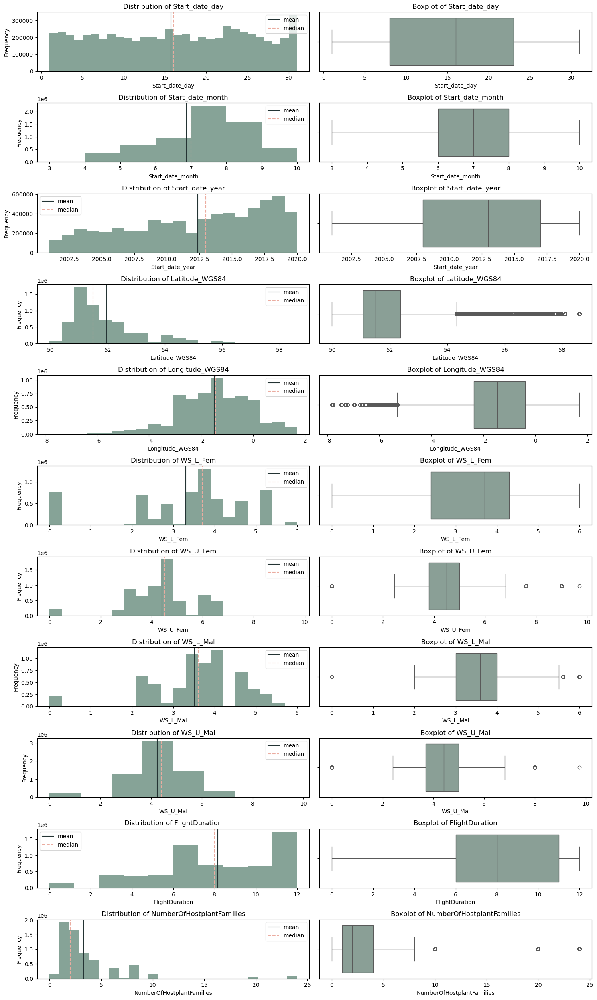

In [57]:
num_col = df_NBN_UKBMS4[['Start_date_day', 'Start_date_month', 'Start_date_year', 'Latitude_WGS84', 'Longitude_WGS84', 'WS_L_Fem', 
                         'WS_U_Fem', 'WS_L_Mal', 'WS_U_Mal', 'FlightDuration', 'NumberOfHostplantFamilies']]
fig, ax = plt.subplots(11, 2, figsize = [15,25])

count = 1
count_2 = 2
nb = 0
bins = [30, 7, 20, 20, 20, 20, 20, 20, 8, 10, 25]

for column in num_col:
    #Plot histogram
    plt.subplot(11, 2, count)
    
    plt.hist(df_NBN_UKBMS4[column], bins = bins[nb], color='#86A397')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    plt.axvline(df_NBN_UKBMS4[column].mean(),color = '#233333',label = 'mean')
    plt.axvline(df_NBN_UKBMS4[column].median(),color = '#EBACA0', linestyle = '--', label = 'median')

    plt.legend()

    #Plot boxplot
    plt.subplot(11, 2, count_2)
    sns.boxplot(x=df_NBN_UKBMS4[column], color="#86A397")
    plt.title(f'Boxplot of {column}')

    count += 2
    count_2 += 2 
    nb += 1 

plt.tight_layout()
    
plt.show()

__COMMENT:__ We can see here:

- `Start_date_day`: nothing major here
- `Start_date_month`: most of the butterfly sightings happen during the summer (July and August), but the first and last month are not idenitfied as outliers in the boxplot, so the sightings are consistant in those months as well.
- `Start_date_year`: we see an increasing number of butterfly sightings over the years. At this point, it is not confirmed if the increasing number of sightings is due to an increasing butterfly population or an increasing number of surveys
- `Latitude_WGS84`: it looks like most of the sightings happen in one region, with a fair amount of latitudes being marked as outliers on the boxplots
- `Longitude_WGS84`: same as Latitude

Important note: for the next columns, the information comes from the LepTraits dataset and the same value is therefore repeated across the rows for the same species. It does inform however how frequently some caracteristics of the butterflies occur:
- `WS_L_Fem`: (lowest measurement reported for female wingspan in centimeters)
- `WS_U_Fem`: (highest (or sole) measurement reported for female wingspan in centimeters)
- `WS_L_Mal`: (lowest measurement reported for male wingspan in centimeters)
- `WS_U_Mal`: (highest (or sole) measurement reported for male wingspan in centimeters)

Nothing major to note for those columns at this point.

- `FlightDuration`: most of the butterfly sightings concern butterfly that fly between 8-11 months (that is interesting since the data we have are sightings from March to October)
- `NumberOfHostplantFamilies`: distribution right skewed , most of the butterfly sightings concern butterfly that have between 0 and 5 hostplant family.

### Categorical columns

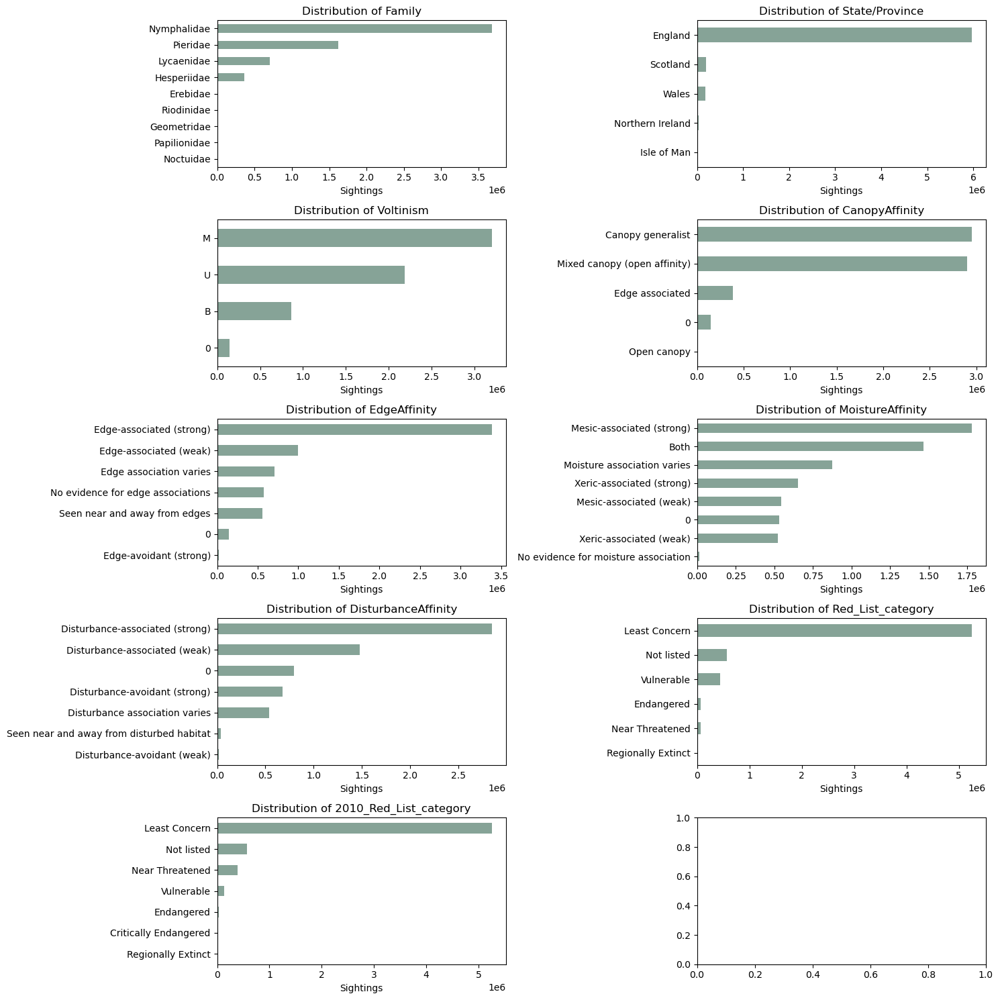

In [58]:
cat_col = df_NBN_UKBMS4[['Family', 'State/Province', 'Voltinism', 'CanopyAffinity', 'EdgeAffinity', 'MoistureAffinity', 
                         'DisturbanceAffinity', 'Red_List_category', '2010_Red_List_category']]
nb = 0
count = 1

fig, ax = plt.subplots(5, 2, figsize = [15,15])

for column in cat_col:
    # Getting the percentage of occurences for each distinct value in a column:
    x = cat_col[column].value_counts().sort_values(ascending = True)
    
    plt.subplot(5, 2, count)
    x.plot(kind = 'barh', color=['#86A397'])
    plt.title(f'Distribution of {column}')
    
    plt.xlabel('Sightings')
    plt.ylabel(None)

    count += 1
    nb += 1

plt.tight_layout()
    
plt.show()

__COMMENT:__ most important findings here:

- `Family`: we have almost 10 families in the dataset, but mostly 4 are present in the sightings
- `State`: most of the sightings are in England
- Other traits information: not much to mention at this point, but it will be interesting to see later in the model if those traits can affect the butterfly resistance to climate change
- `Red List`: without surprise, most of the sightings are for 'Least concern' butterflies, the other categories being less represented becasue those butterfly species population are indeed rarer. 

__COMMENT__: Out of the 71 species in the dataset, just about 20 are seen more than the average number of sightings, this around 30% of all the species.

## Sightings

### Map

In [59]:
# Get only data for July 2020 (map crashes otherwise)
df_NBN_UKBMS4_Jul2020 = df_NBN_UKBMS4[(df_NBN_UKBMS4['Start_date_year'] == 2020) & (df_NBN_UKBMS4['Start_date_month'] == 7)]

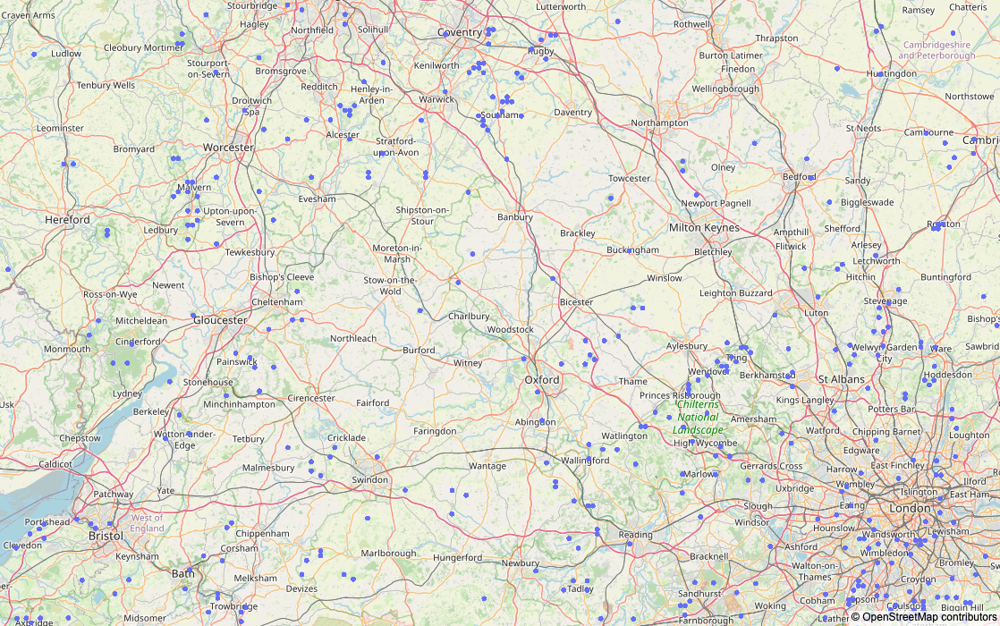

In [60]:
# Map
fig = px.scatter_mapbox(df_NBN_UKBMS4_Jul2020, lat= 'Latitude_WGS84', lon='Longitude_WGS84')
fig.update_layout(mapbox_style="open-street-map", height = 700)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

__COMMENT:__ Most of the sightings occur in England, which confirms what we saw earlier with the Latitude and Longitude boxplots, with 3 areas that seem to gather a lot of surveys:
- London
- Southampton
- Nottingham

As we will need later to focus on one location to be able to merge external factors information, these locations seems like a good place to look into.

### Per Species Vulnerability

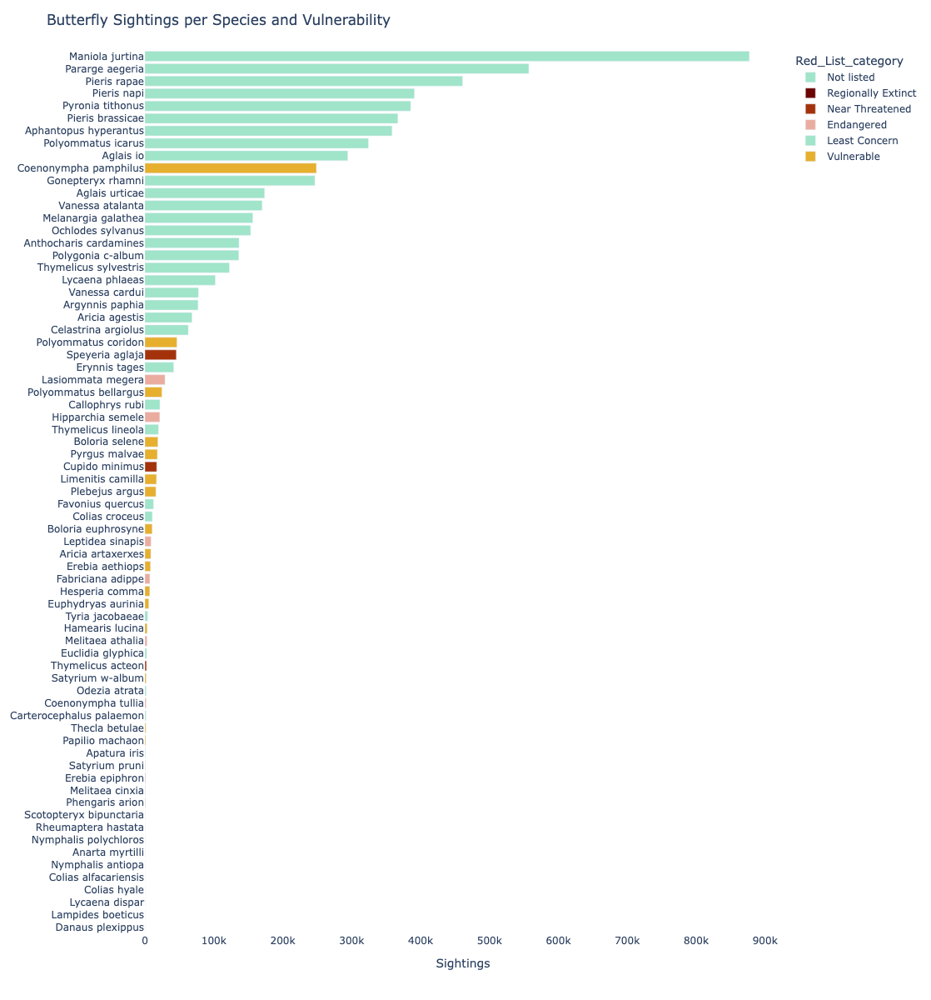

In [61]:
df_vulnerability = df_NBN_UKBMS4.groupby('Red_List_category')['Scientific_name'].value_counts()
df_vulnerability = pd.DataFrame(df_vulnerability).reset_index().sort_values(by='count', ascending=True)

colors = ['#A0E4C9', '#6B0504', '#A3320B','#EBACA0', '#A0E4C9', '#E6AF2E']

fig = px.bar(df_vulnerability, x='count', y='Scientific_name', color='Red_List_category', color_discrete_sequence=colors)
fig.update_xaxes(showgrid=False, title='Sightings')
fig.update_yaxes(showgrid=False, title=None)
fig.update_layout(height=1200, yaxis_categoryorder = 'total ascending', title='Butterfly Sightings per Species and Vulnerability', 
                  plot_bgcolor='white')
fig.show()

### Timeline

#### All sightings

In [62]:
# Adding a Year Month column in the dataset
df_NBN_UKBMS4['Year_Month'] = df_NBN_UKBMS4['Start_date'].dt.strftime('%Y-%m')
df_NBN_UKBMS4['Year_Month'] = pd.to_datetime(df_NBN_UKBMS4['Year_Month'])

# Grouping sightings per month
Sightings = df_NBN_UKBMS4['Year_Month'].value_counts()
Sightings = pd.DataFrame(Sightings).reset_index().sort_values('Year_Month').set_index('Year_Month')
Sightings = Sightings.rename(columns={'count':'Sightings'})
Sightings.head(3)

,Sightings
Year_Month,
2001-03-01,374
2001-04-01,2375
2001-05-01,12339


In [63]:
# Getting first and last date in the dataframe
print(f'First date: {Sightings.index.min()}')
print(f'Last date: {Sightings.index.max()}')

First date: 2001-03-01 00:00:00
Last date: 2020-10-01 00:00:00


We have a difference of 80 months over 20 years


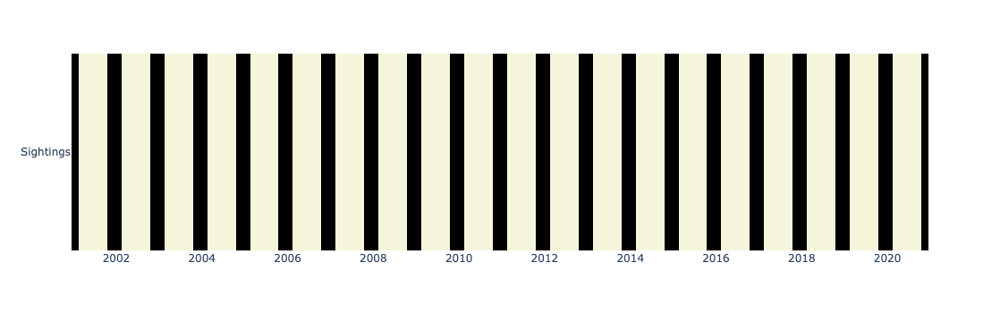

In [64]:
######### Making sure we have values for each month of each year #########

# Getting every months of each year between first and last date in the dataset 
full_index = pd.date_range(start='2001-01-01', end='2020-12-01', freq='MS')
diff_month = len(full_index.difference(Sightings.index))
print(f'We have a difference of {diff_month} months over 20 years')

# Reindexing sightings dataframe to full range of months
Sightings2 = Sightings.reindex(full_index)

# See where the missing values are located
fig = px.imshow(Sightings2.isna().T, color_continuous_scale=['beige', 'black'], height=300, width=1100)
fig.update_layout(coloraxis_showscale=False)
fig.show()

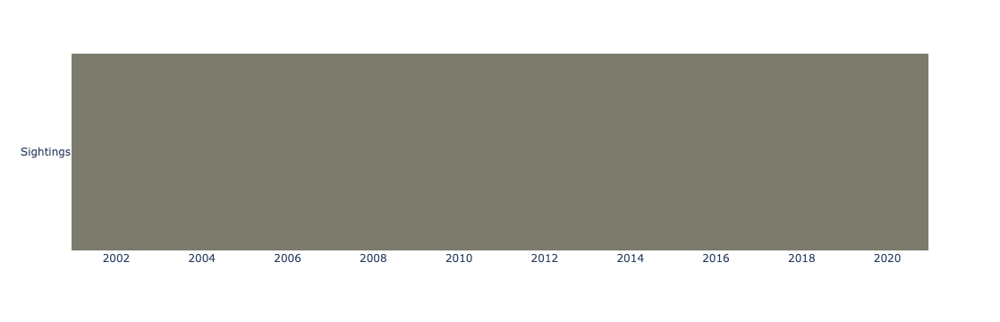

In [65]:
# Filling missing values
Sightings3 = Sightings2.fillna(0) 

# Sanity Check
fig = px.imshow(Sightings3.isna().T, color_continuous_scale=['beige', 'black'], height=300, width=1100)
fig.update_layout(coloraxis_showscale=False)
fig.show()

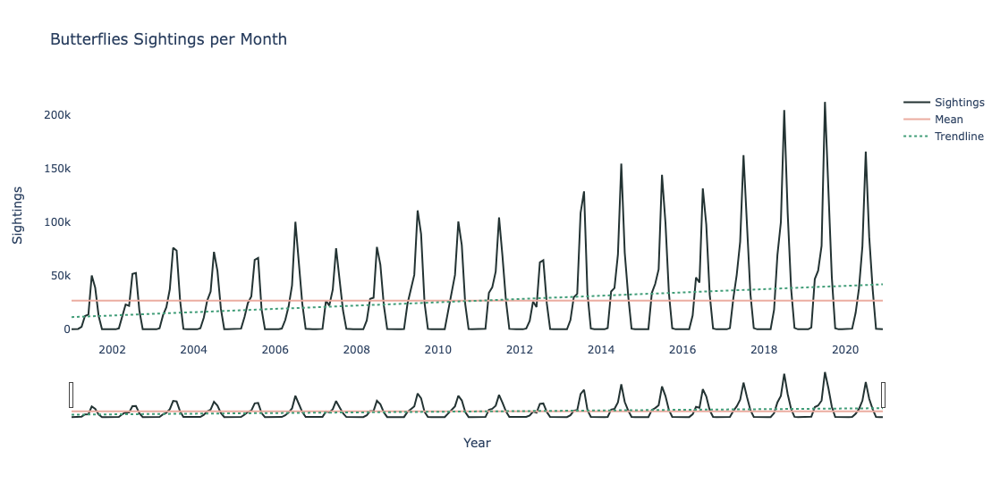

The trendline has an upward slope of about 127.8


In [66]:
# Get Trendline
Sightings3['Order'] = range(len(Sightings3))
X = Sightings3['Order']
y = Sightings3['Sightings']
Sightings_Trendline = sm.OLS(y.values, sm.add_constant(X.values), missing='drop').fit()

# Plot sightings per month
fig = go.Figure()
fig.add_trace(go.Scatter(x=Sightings3.index, 
                         y=Sightings3['Sightings'], 
                         mode='lines', name='Sightings', line=dict(color='#233333')))
fig.add_trace(go.Scatter(x=Sightings3.index, 
                         y=[Sightings3['Sightings'].mean()]*len(Sightings3), 
                         mode='lines', name='Mean', line=dict(color='#EBACA0')))
fig.add_trace(go.Scatter(x=Sightings3.index, 
                         y=Sightings_Trendline.predict(), 
                         mode='lines', name='Trendline', line_dash='dot', line=dict(color='#419D78')))

fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(yaxis_title='Sightings', xaxis_title='Year',
                  title='Butterflies Sightings per Month',
                  width = 1100, height = 550, plot_bgcolor='white', showlegend=True)
fig.show()

# Trendline parameters
print(f'The trendline has an upward slope of about {round(Sightings_Trendline.params[1],1)}')

__COMMENT__: We can see here:

- A clear seasonal pattern, with a peak in the number of Sightings around July each year
- An upward trend over the years
- The number of sightings varies from year to year: starting in 2006, we have a clear increase in the number of sightings but we still see three significant drops over the years, in 2007/2008 and 2013.
- There is a significant peak in 2018 and 2019: the butterfly conservation website mentions an increased media coverage for butterfly conservation efforts and the Butterfly counts organised that year which could have led to the number of sightings we see here.
- Note that the 2020 early season has been impacted by the pandemic (cf 2019 UKBMS annual report).

As the number of sightings is not an indication of the overall butterfly population but the number of butterflies seen during transects rather, we have to understand how many transets were undertaken each month. We will explore that in the 'Surveys' section

#### Per species - Top 15 most seen

__COMMENT:__ Here, we want to have a closer look at how the species evolve over the year and months, with a focus on the 15 most seen species

In [67]:
Species_Top_15_counts = df_NBN_UKBMS4[['Scientific_name']].value_counts().sort_values(ascending=False).head(15)
Species_Top_15_Perc = Species_Top_15_counts.sum() / df_NBN_UKBMS4[['Scientific_name']].value_counts().sum() *100

print(f'The top 15 Species account for {round(Species_Top_15_Perc,2)}% of the butterflies sightings in the dataset.')

The top 15 Species account for 80.81% of the butterflies sightings in the dataset.


In [68]:
# Creating a list of 15 most seen butterflies
Species_Top_15_list = pd.DataFrame(Species_Top_15_counts)
Species_Top_15_list = Species_Top_15_list.reset_index()
Species_Top_15_list = list(Species_Top_15_list['Scientific_name'].unique())
Species_Top_15_list

['Maniola jurtina',
 'Pararge aegeria',
 'Pieris rapae',
 'Pieris napi',
 'Pyronia tithonus',
 'Pieris brassicae',
 'Aphantopus hyperantus',
 'Polyommatus icarus',
 'Aglais io',
 'Coenonympha pamphilus',
 'Gonepteryx rhamni',
 'Aglais urticae',
 'Vanessa atalanta',
 'Melanargia galathea',
 'Ochlodes sylvanus']

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



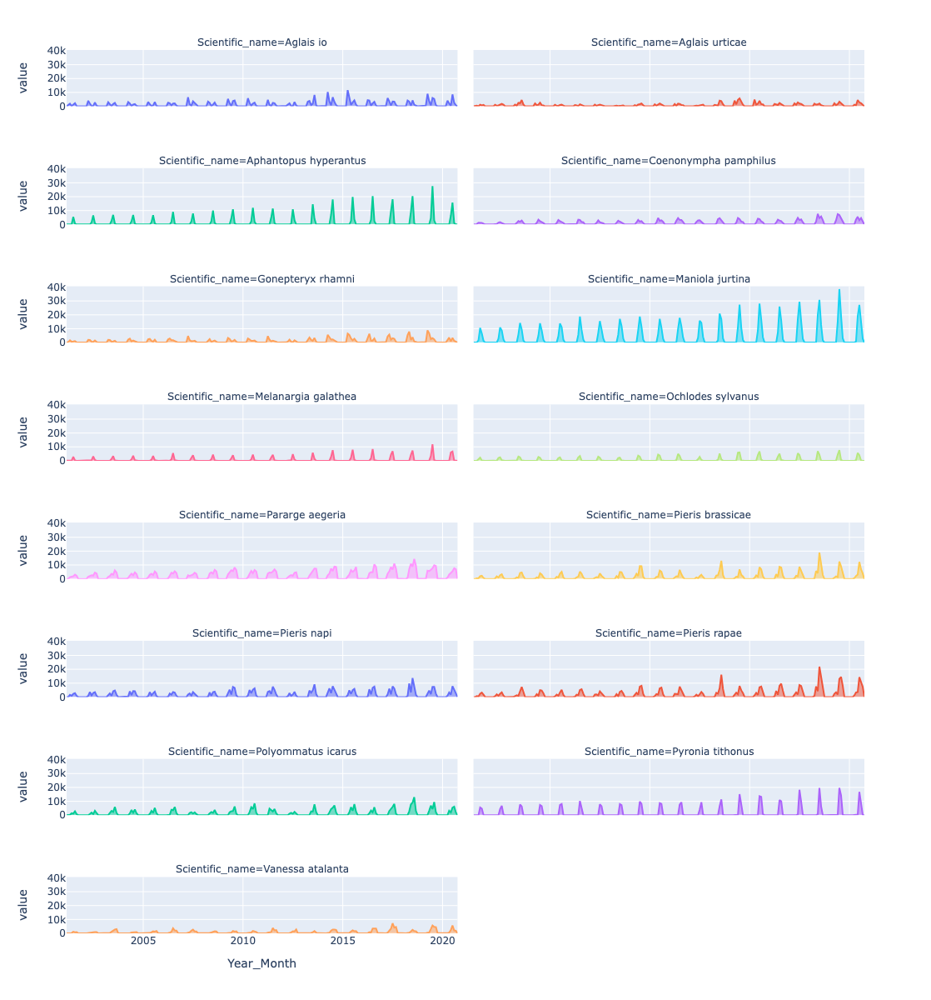

In [69]:
# Creating a subset of the UKBMS dataset with only the top 15 most seen butterflies
Species_Top_15_df = df_NBN_UKBMS4[df_NBN_UKBMS4['Scientific_name'].isin(Species_Top_15_list)]

# Creating df for plots
Species_Top_15_Month = Species_Top_15_df.groupby('Scientific_name')['Year_Month'].value_counts()
Species_Top_15_Month = pd.DataFrame(Species_Top_15_Month)
Species_Top_15_Month = Species_Top_15_Month.reset_index()
Species_Top_15_Month = Species_Top_15_Month.pivot(index='Year_Month', columns='Scientific_name', values='count')
Species_Top_15_Month.head(3)

# Plot
fig = px.area(Species_Top_15_Month, facet_col='Scientific_name', facet_col_wrap=2)
fig.update_layout(showlegend=False, height=1200, width=1200)
fig.show()

__COMMENT__: Although sightings are not an indicator for the butterfly population, we are still able to identify here for each species the fluctuations over the seasons, which is aligned with what we might expect from this kind of data. 

## Surveys

In [70]:
# Counting the number of unique sites (OSGR) surveyed per day
Num_Surveys = df_NBN_UKBMS4.groupby(['Start_date'])['OSGR'].nunique() 
Num_Surveys = pd.DataFrame(Num_Surveys)
Num_Surveys = Num_Surveys.resample('MS').sum().reindex(full_index).fillna(0)
Num_Surveys = Num_Surveys.rename(columns={'OSGR':'NumSurveys'})
# Sanity Check
diff_month = len(full_index.difference(Num_Surveys.index))
print(f'We have a difference of {diff_month} months over 20 years')

We have a difference of 0 months over 20 years


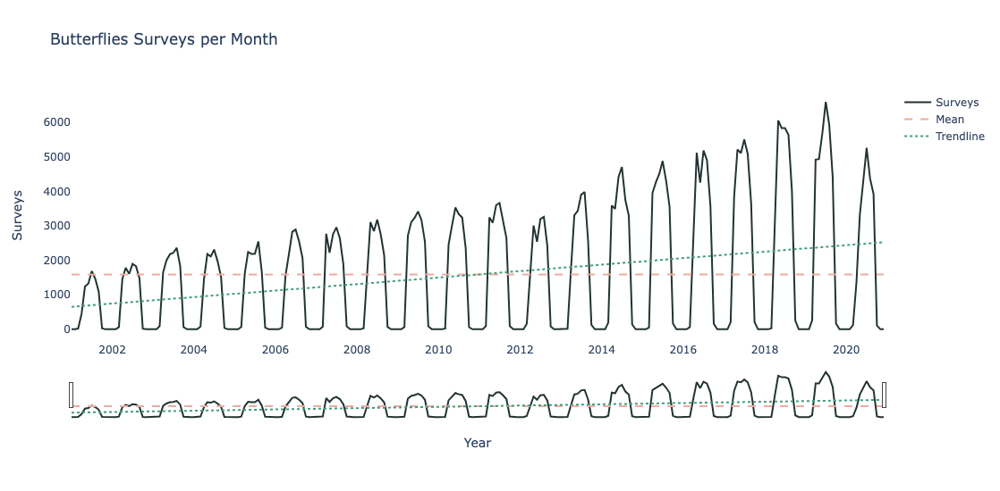

The trendline has an upward slope of about 7.8378


In [71]:
# Get Trendline
Num_Surveys['Order'] = range(len(Num_Surveys))
X = Num_Surveys['Order']
y = Num_Surveys['NumSurveys']
Surveys_Trendline = sm.OLS(y.values, sm.add_constant(X.values), missing='drop').fit()

# Plot surveys per month
fig = go.Figure()
fig.add_trace(go.Scatter(x=Num_Surveys.index, 
                         y=Num_Surveys['NumSurveys'], 
                         mode='lines', name='Surveys', line=dict(color='#233333')))
fig.add_trace(go.Scatter(x=Num_Surveys.index, 
                         y=[Num_Surveys['NumSurveys'].mean()]*len(Num_Surveys), 
                         mode='lines', name='Mean', line_dash='dash', line=dict(color='#EBACA0')))
fig.add_trace(go.Scatter(x=Num_Surveys.index, 
                         y=Surveys_Trendline.predict(), 
                         mode='lines', name='Trendline', line_dash='dot', line=dict(color='#419D78')))

fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(yaxis_title='Surveys', xaxis_title='Year',
                  title='Butterflies Surveys per Month',
                  width = 1100, height = 550, plot_bgcolor='white', showlegend=True)
# fig.add_vrect(x0=2001-01-01, x1=2005-12-01, line_width=0, fillcolor="#EBACA0", opacity=0.2)
fig.show()

# Trendline parameters
print(f'The trendline has an upward slope of about {round(Surveys_Trendline.params[1],4)}')

__COMMENT:__ We see here that the number of surveys has considerably increased over the years. This means that the butterfly sightings are most likely to increase too, not necessarily because the butterfly population is increasing (although this is also a possibility of course), but because more people are out there counting them.

The idea here is to get an estimation of the butterfly population evolution by taking a constant indicator over the years, as an example:

- First year: 100 surveys, 110 butterflies seen => 1.1 butterfly seen per survey
- Last year: 500 surveys, 450 butterflies seen => 0.9 butterfly seen per survey

To get an idea of how the butterfly population is evolving, we will therefore follow this indicator: number of butterflies seen in each survey.

## Butterflies seen per Survey

In [72]:
# Merging the Sightings and Surveys dataframes
Sightings_Surveys = pd.merge(Sightings3, Num_Surveys.drop(columns=['Order']), 
                             left_index=True, right_index=True)

# Calculting index for each month of every year
Sightings_Surveys['Butterflies_per_Survey'] = round((Sightings_Surveys['Sightings'] / Sightings_Surveys['NumSurveys']),4)
Sightings_Surveys['Butterflies_per_Survey'] = Sightings_Surveys['Butterflies_per_Survey'].fillna(0)
Sightings_Surveys.tail(10)

,Sightings,Order,NumSurveys,Butterflies_per_Survey
2020-03-01,589.0,230,120.0,4.9083
2020-04-01,15246.0,231,1367.0,11.1529
2020-05-01,38033.0,232,3312.0,11.4834
2020-06-01,77355.0,233,4300.0,17.9895
2020-07-01,165625.0,234,5264.0,31.4637
2020-08-01,86109.0,235,4367.0,19.7181
2020-09-01,37234.0,236,3920.0,9.4985
2020-10-01,447.0,237,109.0,4.1009
2020-11-01,0.0,238,0.0,0.0000
2020-12-01,0.0,239,0.0,0.0000


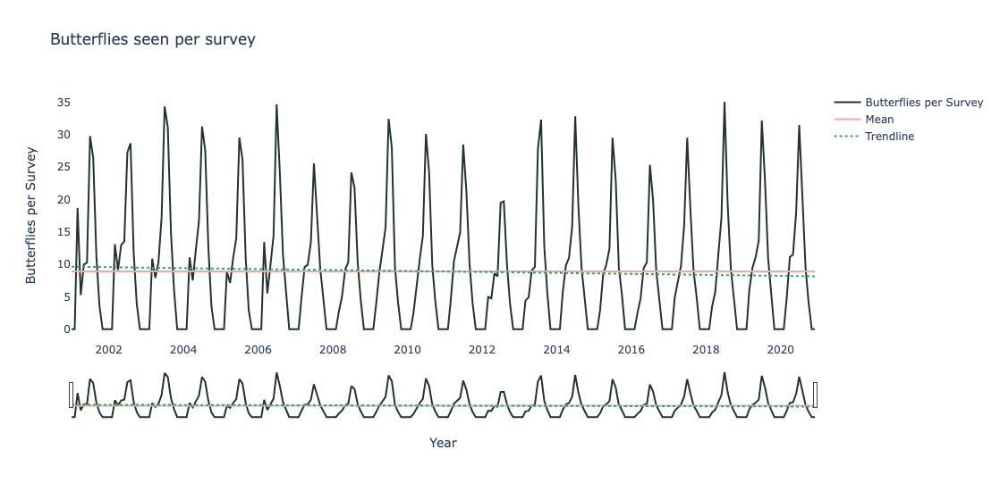

The trendline has a downward slope of about -0.0062


In [73]:
# Get Trendline
X = Sightings_Surveys['Order']
y = Sightings_Surveys['Butterflies_per_Survey']
Butterflies_per_Survey_Trendline = sm.OLS(y.values, sm.add_constant(X.values), missing='drop').fit()

# Plot Butterflies per survey per month
fig = go.Figure()
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, 
                         y=Sightings_Surveys['Butterflies_per_Survey'], 
                         mode='lines', name='Butterflies per Survey', line=dict(color='#233333')))
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, 
                         y=[Sightings_Surveys['Butterflies_per_Survey'].mean()]*len(Sightings_Surveys), 
                         mode='lines', name='Mean', line=dict(color='#EBACA0')))
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, 
                         y=Butterflies_per_Survey_Trendline.predict(), 
                         mode='lines', name='Trendline', line_dash='dot', line=dict(color='#419D78')))

fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(yaxis_title='Butterflies per Survey', xaxis_title='Year',
                  title='Butterflies seen per survey',
                  width = 1100, height = 550, plot_bgcolor='white', showlegend=True)
fig.show()

# Trendline parameters
print(f'The trendline has a downward slope of about {round(Butterflies_per_Survey_Trendline.params[1],4)}')

__COMMENT:__ We can see here a very slight trend downward now: our indicator for the butterfly population tends to indicate that the butterfly population is decreasing.

# Model dataset preparation: Focus London

__COMMENT:__ In the dataset, we have Latitude and Longitude information. We tried reverse geocoding using geopy.geocoders, but for most of the coordinates in our dataset, the city was not extracted. We have looked for several options online, but for the volumes of data we have here, we could not find any free or fast options. 

So, we went for a slightly different approach in the interest of time: instead of getting all London sightings locations using exact address, we found the North/West/South/East London borders coordinates and selected all Survey sites within that rectangle. Given that the external factors we are going to work with do not stop at the city delimitation (temperatures, air quality...), this will have minimal impact on the analysis. The selected sites are found within the red rectangle below:

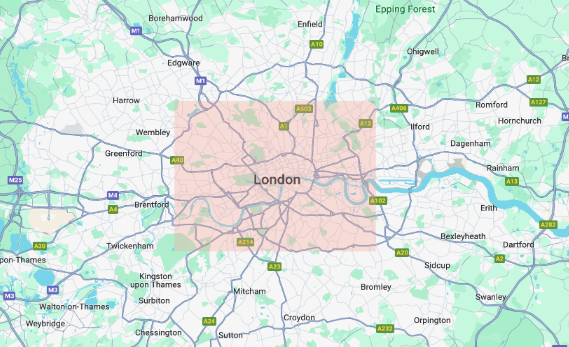
<div class="alert alert-block alert-warning">
<b>Note:</b> the red rectangle here is only meant to demonstrate the selection process, the limits drawn are not exactly the coordinates of the dictionnary below.
</div>

Coordinates from Google Maps (for reference: London coordinates: 51.5069929036787, -0.12895107981895967)

- North limit (East Finchley): 51.588630815436694, -0.1643575215318488
- West limit (Ealing Broadway): 51.51579375371216, -0.30187377451799874
- South limit (Forest Hill): 51.43994448064052, -0.053144999395431505
- East Limit (West Ham): 51.541423629135906, 0.012457120163976551

In [74]:
London_coord = {'North limit': [51.588630815436694, -0.1643575215318488],
                'West limit': [51.51579375371216, -0.30187377451799874],
                'South limit': [51.43994448064052, -0.053144999395431505], 
                'East Limit': [51.541423629135906, 0.012457120163976551]}
London_coord_df = pd.DataFrame(London_coord, index=['Latitude', 'Longitude']).T
London_coord_df

,Latitude,Longitude
North limit,51.588631,-0.164358
West limit,51.515794,-0.301874
South limit,51.439944,-0.053145
East Limit,51.541424,0.012457


In [75]:
# Getting selection rectangle coordinates
print(f"Min Lat value: {London_coord_df['Latitude'].min()}")
print(f"Max Lat value: {London_coord_df['Latitude'].max()}")
print(f"Min Lon value: {London_coord_df['Longitude'].min()}")
print(f"Max Lon value: {London_coord_df['Longitude'].max()}")

Min Lat value: 51.43994448064052
Max Lat value: 51.588630815436694
Min Lon value: -0.30187377451799874
Max Lon value: 0.012457120163976551


In [76]:
# Slicing D1 with London Sightings locations
GLondon_df = df_NBN_UKBMS4[(df_NBN_UKBMS4['Latitude_WGS84'] >= London_coord_df['Latitude'].min()) & \
                (df_NBN_UKBMS4['Latitude_WGS84'] <= London_coord_df['Latitude'].max()) & \
                (df_NBN_UKBMS4['Longitude_WGS84'] >= London_coord_df['Longitude'].min()) & \
                (df_NBN_UKBMS4['Longitude_WGS84'] <= London_coord_df['Longitude'].max())]

In [77]:
# Sanity Check - for min and max values of Latitude/Longitude
GLondon_df[['Latitude_WGS84', 'Longitude_WGS84']].describe()

,Latitude_WGS84,Longitude_WGS84
count,65048.000000,65048.000000
mean,51.515220,-0.166261
std,0.047689,0.100621
min,51.444289,-0.281758
25%,51.483197,-0.267375
50%,51.524925,-0.166697
75%,51.570097,-0.034953
max,51.580029,0.007447


In [78]:
print(f'We were able to extract {GLondon_df.shape[0]} London Butterfly sightings. We will work with those for the Time Series analysis.')

We were able to extract 65048 London Butterfly sightings. We will work with those for the Time Series analysis.


In [79]:
GLondon_df.head()

,Occurrence_ID,Scientific_name,Common_name,Start_date,Start_date_day,Start_date_month,Start_date_year,OSGR,Latitude_WGS84,Longitude_WGS84,...,FlightDuration,Voltinism,CanopyAffinity,EdgeAffinity,MoistureAffinity,DisturbanceAffinity,NumberOfHostplantFamilies,Red_List_category,2010_Red_List_category,Year_Month
648,6185761,Pieris rapae,Small White,2009-04-15,15,4,2009,TQ3687,51.569856,-0.031855,...,12.0,M,Mixed canopy (open affinity),Edge-associated (weak),Both,Disturbance-associated (strong),8.0,Least Concern,Least Concern,2009-04-01
677,5844261,Pieris napi,Green-veined White,2009-04-23,23,4,2009,TQ2786,51.562974,-0.162002,...,10.0,M,Canopy generalist,Edge-associated (strong),Mesic-associated (strong),Disturbance association varies,3.0,Least Concern,Least Concern,2009-04-01
733,5615071,Aglais io,Peacock,2009-04-22,22,4,2009,TQ1987,51.573711,-0.277017,...,8.0,B,Canopy generalist,Edge-associated (weak),Mesic-associated (weak),Disturbance-associated (weak),3.0,Least Concern,Least Concern,2009-04-01
848,5839806,Pararge aegeria,Speckled Wood,2009-04-08,8,4,2009,TQ2277,51.483197,-0.237224,...,9.0,M,Mixed canopy (open affinity),No evidence for edge associations,Mesic-associated (strong),Disturbance-associated (strong),1.0,Not listed,Not listed,2009-04-01
892,5825798,Pieris rapae,Small White,2009-04-22,22,4,2009,TQ2787,51.571961,-0.161640,...,12.0,M,Mixed canopy (open affinity),Edge-associated (weak),Both,Disturbance-associated (strong),8.0,Least Concern,Least Concern,2009-04-01


In [80]:
GLondon_df.shape

(65048, 43)

In [81]:
############ LONDON SIGHTINGS ############
# Grouping sightings per month in London sites selected
Sightings_London = GLondon_df['Year_Month'].value_counts()
Sightings_London = pd.DataFrame(Sightings_London).reset_index().sort_values('Year_Month').set_index('Year_Month')
Sightings_London = Sightings_London.rename(columns={'count':'Sightings'})

# Reindexing sightings dataframe to full range of months
Sightings_London_2 = Sightings_London.reindex(full_index)

# Filling missing values
Sightings_London_3 = Sightings_London_2.fillna(0) 

In [82]:
############ LONDON SURVEYS ############
Num_Surveys = GLondon_df.groupby(['Start_date'])['OSGR'].nunique() 
Num_Surveys = pd.DataFrame(Num_Surveys)
Num_Surveys = Num_Surveys.resample('MS').sum().reindex(full_index).fillna(0)
Num_Surveys = Num_Surveys.rename(columns={'OSGR':'NumSurveys'})

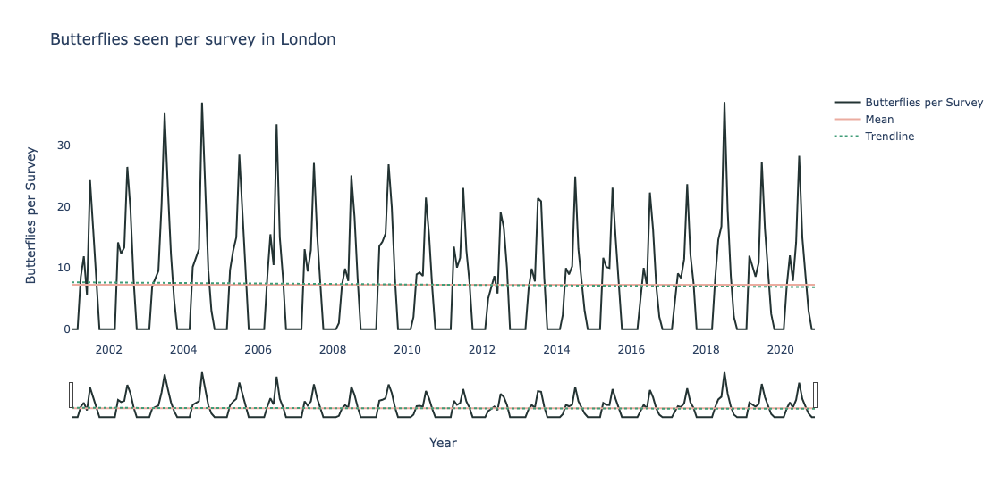

The trendline has a downward slope of about -0.0033


In [83]:
############ BUTTERFLIES SEEN PER SURVEY IN LONDON ############
Sightings_Surveys = pd.merge(Sightings_London_3, Num_Surveys, left_index=True, right_index=True)

# Calculting index for each month of every year
Sightings_Surveys['Butterflies_per_Survey'] = round((Sightings_Surveys['Sightings'] / Sightings_Surveys['NumSurveys']),4)
Sightings_Surveys['Butterflies_per_Survey'] = Sightings_Surveys['Butterflies_per_Survey'].fillna(0)

# Get Trendline
Sightings_Surveys['Order'] = range(len(Sightings_Surveys))
X = Sightings_Surveys['Order']
y = Sightings_Surveys['Butterflies_per_Survey']
Butterflies_per_Survey_Trendline = sm.OLS(y.values, sm.add_constant(X.values), missing='drop').fit()

# Plot Butterflies per survey per month
fig = go.Figure()
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, 
                         y=Sightings_Surveys['Butterflies_per_Survey'], 
                         mode='lines', name='Butterflies per Survey', line=dict(color='#233333')))
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, 
                         y=[Sightings_Surveys['Butterflies_per_Survey'].mean()]*len(Sightings_Surveys), 
                         mode='lines', name='Mean', line=dict(color='#EBACA0')))
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, 
                         y=Butterflies_per_Survey_Trendline.predict(), 
                         mode='lines', name='Trendline', line_dash='dot', line=dict(color='#419D78')))

fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(yaxis_title='Butterflies per Survey', xaxis_title='Year',
                  title='Butterflies seen per survey in London',
                  width = 1100, height = 550, plot_bgcolor='white', showlegend=True)
fig.show()

# Trendline parameters
print(f'The trendline has a downward slope of about {round(Butterflies_per_Survey_Trendline.params[1],4)}')

__COMMENT:__ We can see here a very slight trend downward. Now, that we have the indicator for estimating the butterfly population evoluation, we will explore further the time series to understand how trend / seasonality / residuals are actually working here:

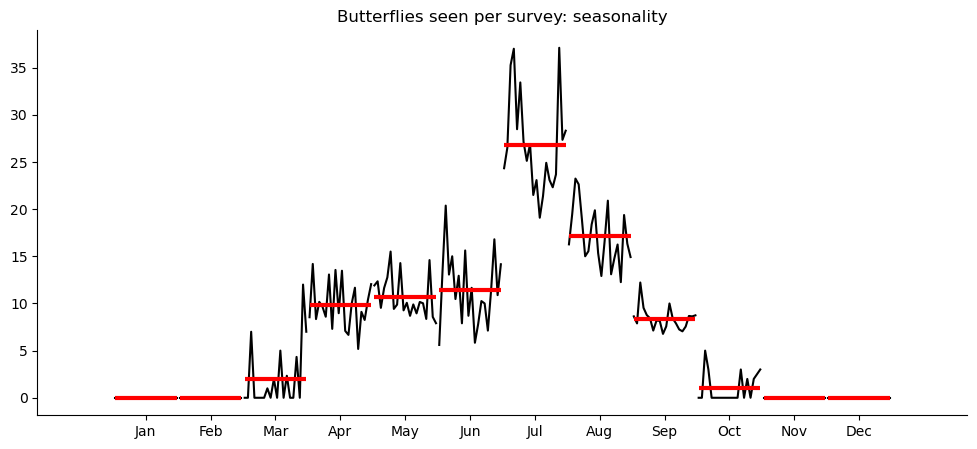

In [84]:
# Creating a seasonal plot
plt.figure(figsize=(12, 5))
month_plot(Sightings_Surveys['Butterflies_per_Survey'], ax=plt.gca())
plt.title('Butterflies seen per survey: seasonality')
sns.despine()
plt.show()

__COMMENT:__ The intuition of seasonality we had before is shown here:

- July is definitely a month where more butterflies are spotted during the surveys, closerly followed by August
- April/May/June/September have similar counts average
- March and October have very low results compared to the other months, October even has several years without any counts

We will now further explore trend / seasonality and residuals in the dataset:

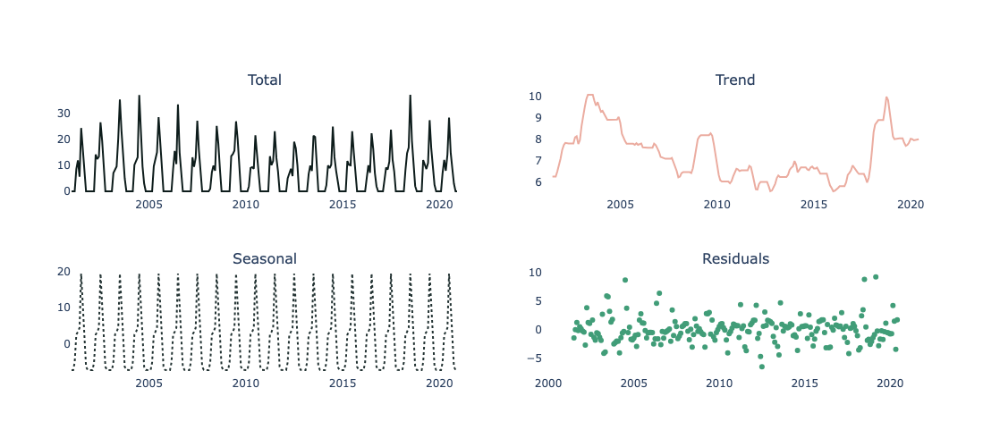

In [85]:
# Seasonal Decompose
decomposition = tsa.seasonal_decompose(Sightings_Surveys['Butterflies_per_Survey'], model='additive')
Sightings_Surveys['Trend'] = decomposition.trend
Sightings_Surveys['Seasonal'] = decomposition.seasonal
Sightings_Surveys['Residuals'] = decomposition.resid

# Plot
cols = ['Total', 'Trend', 'Seasonal', 'Residuals']
fig = make_subplots(rows=2, cols=2, subplot_titles=cols)

fig.add_trace(go.Scatter(x=Sightings_Surveys.index, y=Sightings_Surveys['Butterflies_per_Survey'], line=dict(color='#0E1D1C')), 
              row=1, col=1)
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, y=Sightings_Surveys['Trend'], line=dict(color='#EBACA0')), 
              row=1, col=2)
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, y=Sightings_Surveys['Seasonal'], line=dict(color='#233333'), line_dash='dot'), 
              row=2, col=1)
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, y=Sightings_Surveys['Residuals'], mode='markers', line=dict(color='#419D78')), 
              row=2, col=2)

fig.update_layout(height=500, width=1150, showlegend=False, plot_bgcolor='white')
fig.show()

__COMMENT:__ The seasonal decompose seems to nicely capture the yearly seasonality here. The trend is a bit more complex to apprehend:

- There is clear downward trend from 2003 to 2012, with a sudden peak in 2009. Note that it will be very interesting to cross in our analysis air quality data as we know that London Low Emission Zone (LEZ) policies started in 2008 (thus 1 year prior), restricting the most pollutant vehicles from entering London without paying a fee. 
- The 2018 peak is also present here and not understood as 'accidental' by the calculations, however 2019 and 2020 do not follow this note.

Note that the second part of the low emission initiative (ULEZ) was introduced in 2019, however, we do not see an impact in the data here if there is any (but this could show in the 2021 trend which we do not have).

Overall, we have downward trend for butterflies seen per Survey:

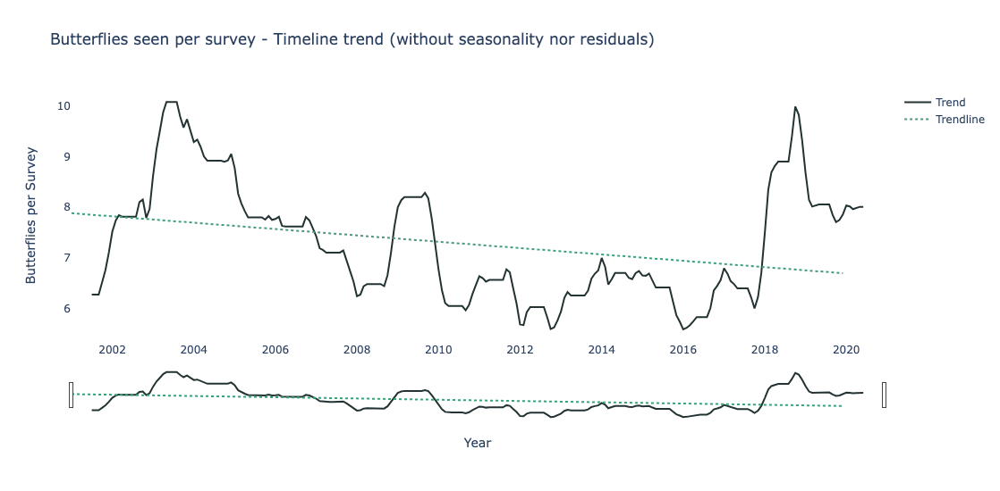

The trendline has a downward slope of about -0.0052


In [86]:
# Get Trendline for trend only
X = Sightings_Surveys['Order']
y = Sightings_Surveys['Trend']
Trend_Trendline = sm.OLS(y.values, sm.add_constant(X.values), missing='drop').fit()

# Plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, 
                         y=Sightings_Surveys['Trend'], 
                         mode='lines', name='Trend', line=dict(color='#233333')))
fig.add_trace(go.Scatter(x=Sightings_Surveys.index, 
                         y=Trend_Trendline.predict(), 
                         mode='lines', name='Trendline', line_dash='dot', line=dict(color='#419D78')))

fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(yaxis_title='Butterflies per Survey', xaxis_title='Year',
                  title='Butterflies seen per survey - Timeline trend (without seasonality nor residuals)',
                  width = 1100, height = 550, plot_bgcolor='white', showlegend=True)
fig.show()

# Trendline parameters
print(f'The trendline has a downward slope of about {round(Trend_Trendline.params[1],4)}')

In [87]:
Sightings_Surveys.to_csv('Sightings_Surveys_London.csv')